Import Necessary Libraries



In [17]:
# Importing the libraries needed for data manipulation, visualization, and statistical analysis
import numpy as np           # Used for numerical operations
import pandas as pd          # Used for data manipulation and analysis
import matplotlib.pyplot as plt # Used for creating static visualizations
import seaborn as sns        # Used for statistical data visualization
import plotly.express as px  # Used for interactive visualizations
import plotly.graph_objects as go # Used for creating more complex interactive visualizations
from scipy.stats import ttest_ind # Used for performing T-tests
from sklearn.preprocessing import StandardScaler
# Load the California housing dataset from sklearn
from sklearn.datasets import fetch_california_housing


Load the Dataset

Convert it to Pandas Dataframe

In [29]:
# Fetching the California housing dataset
california_housing = fetch_california_housing()

print(type(california_housing))

# Creating a DataFrame from the dataset with feature names as column names
df = pd.DataFrame(california_housing.data, columns=california_housing.feature_names)

# Adding the target variable 'MedHouseVal' (median house value) to the DataFrame
df['MedHouseVal'] = california_housing.target

# Displaying the first few rows of the DataFrame to understand its structure
print(df.head())


<class 'sklearn.utils._bunch.Bunch'>
   MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
0  8.3252      41.0  6.984127   1.023810       322.0  2.555556     37.88   
1  8.3014      21.0  6.238137   0.971880      2401.0  2.109842     37.86   
2  7.2574      52.0  8.288136   1.073446       496.0  2.802260     37.85   
3  5.6431      52.0  5.817352   1.073059       558.0  2.547945     37.85   
4  3.8462      52.0  6.281853   1.081081       565.0  2.181467     37.85   

   Longitude  MedHouseVal  
0    -122.23        4.526  
1    -122.22        3.585  
2    -122.24        3.521  
3    -122.25        3.413  
4    -122.25        3.422  


Data Cleaning -

-check for missing vlaues

-remove duplicates

-(optional) - fixing column formats

-(optional) - removing outliers

In [4]:
# Checking for any missing values in the DataFrame
print(df.isnull().sum())


MedInc         0
HouseAge       0
AveRooms       0
AveBedrms      0
Population     0
AveOccup       0
Latitude       0
Longitude      0
MedHouseVal    0
dtype: int64


Artificially adding nulls in my data

In [5]:
df.loc[0:10, 'AveRooms'] = np.nan

In [6]:
print(df.isnull().sum())

MedInc          0
HouseAge        0
AveRooms       11
AveBedrms       0
Population      0
AveOccup        0
Latitude        0
Longitude       0
MedHouseVal     0
dtype: int64


Few options-

imputation:

-Mean

-Median

-Mode

-KNN

Removal:
-Remove whole columns

-Remove rows with nulls (if not too much percentage of my dataset)

In [7]:
df['AveRooms'].fillna(df['AveRooms'].mean(), inplace=True)

Remove Duplicates

In [8]:
print(df.duplicated().sum())

0


In [9]:
df.drop_duplicates(inplace=True)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


Standardization of the numerical features

In [30]:
df_copy_with_std = df.copy()

In [31]:
numerical_features = df_copy_with_std.drop(columns=['MedHouseVal','Latitude', 'Longitude']).columns
numerical_features

Index(['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population',
       'AveOccup'],
      dtype='object')

In [32]:
for feature in numerical_features:
  mean =df_copy_with_std[feature].mean()
  std = df_copy_with_std[feature].std()
  df_copy_with_std[f'{feature}_std']= (df_copy_with_std[feature]-mean)/std

print(df_copy_with_std.head())

   MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
0  8.3252      41.0  6.984127   1.023810       322.0  2.555556     37.88   
1  8.3014      21.0  6.238137   0.971880      2401.0  2.109842     37.86   
2  7.2574      52.0  8.288136   1.073446       496.0  2.802260     37.85   
3  5.6431      52.0  5.817352   1.073059       558.0  2.547945     37.85   
4  3.8462      52.0  6.281853   1.081081       565.0  2.181467     37.85   

   Longitude  MedHouseVal  MedInc_std  HouseAge_std  AveRooms_std  \
0    -122.23        4.526    2.344709      0.982119      0.628544   
1    -122.22        3.585    2.332181     -0.607004      0.327033   
2    -122.24        3.521    1.782656      1.856137      1.155592   
3    -122.25        3.413    0.932945      1.856137      0.156962   
4    -122.25        3.422   -0.012881      1.856137      0.344702   

   AveBedrms_std  Population_std  AveOccup_std  
0      -0.153754       -0.974405     -0.049595  
1      -0.263329        0.8614

In [20]:
scaler =StandardScaler()

df[numerical_features] = scaler.fit_transform(df[numerical_features])

print(df.head())

     MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
0  2.344766  0.982143  0.628559  -0.153758   -0.974429 -0.049597     37.88   
1  2.332238 -0.607019  0.327041  -0.263336    0.861439 -0.092512     37.86   
2  1.782699  1.856182  1.155620  -0.049016   -0.820777 -0.025843     37.85   
3  0.932968  1.856182  0.156966  -0.049833   -0.766028 -0.050329     37.85   
4 -0.012881  1.856182  0.344711  -0.032906   -0.759847 -0.085616     37.85   

   Longitude  MedHouseVal  
0    -122.23        4.526  
1    -122.22        3.585  
2    -122.24        3.521  
3    -122.25        3.413  
4    -122.25        3.422  


EDA - Exploratory Data Analysis

In [33]:
# Displaying descriptive statistics of the DataFrame
print(df_copy_with_std.describe())


             MedInc      HouseAge      AveRooms     AveBedrms    Population  \
count  20640.000000  20640.000000  20640.000000  20640.000000  20640.000000   
mean       3.870671     28.639486      5.429000      1.096675   1425.476744   
std        1.899822     12.585558      2.474173      0.473911   1132.462122   
min        0.499900      1.000000      0.846154      0.333333      3.000000   
25%        2.563400     18.000000      4.440716      1.006079    787.000000   
50%        3.534800     29.000000      5.229129      1.048780   1166.000000   
75%        4.743250     37.000000      6.052381      1.099526   1725.000000   
max       15.000100     52.000000    141.909091     34.066667  35682.000000   

           AveOccup      Latitude     Longitude   MedHouseVal    MedInc_std  \
count  20640.000000  20640.000000  20640.000000  20640.000000  2.064000e+04   
mean       3.070655     35.631861   -119.569704      2.068558  7.711317e-17   
std       10.386050      2.135952      2.003532    

In [34]:
df_copy_with_std.rename(columns={
    'MedInc': 'MedInc_10k',
    'HouseAge': 'HouseAge_years',
    'AveRooms': 'AveRooms',
    'AveBedrms': 'AveBedrms',
    'Population': 'Population',
    'AveOccup': 'AveOccup',
    'Latitude': 'Latitude_degrees',
    'Longitude': 'Longitude_degrees',
    'MedHouseVal': 'MedHouseVal_100k'
}, inplace=True)
print(df.head())

   MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
0  8.3252      41.0  6.984127   1.023810       322.0  2.555556     37.88   
1  8.3014      21.0  6.238137   0.971880      2401.0  2.109842     37.86   
2  7.2574      52.0  8.288136   1.073446       496.0  2.802260     37.85   
3  5.6431      52.0  5.817352   1.073059       558.0  2.547945     37.85   
4  3.8462      52.0  6.281853   1.081081       565.0  2.181467     37.85   

   Longitude  MedHouseVal  
0    -122.23        4.526  
1    -122.22        3.585  
2    -122.24        3.521  
3    -122.25        3.413  
4    -122.25        3.422  


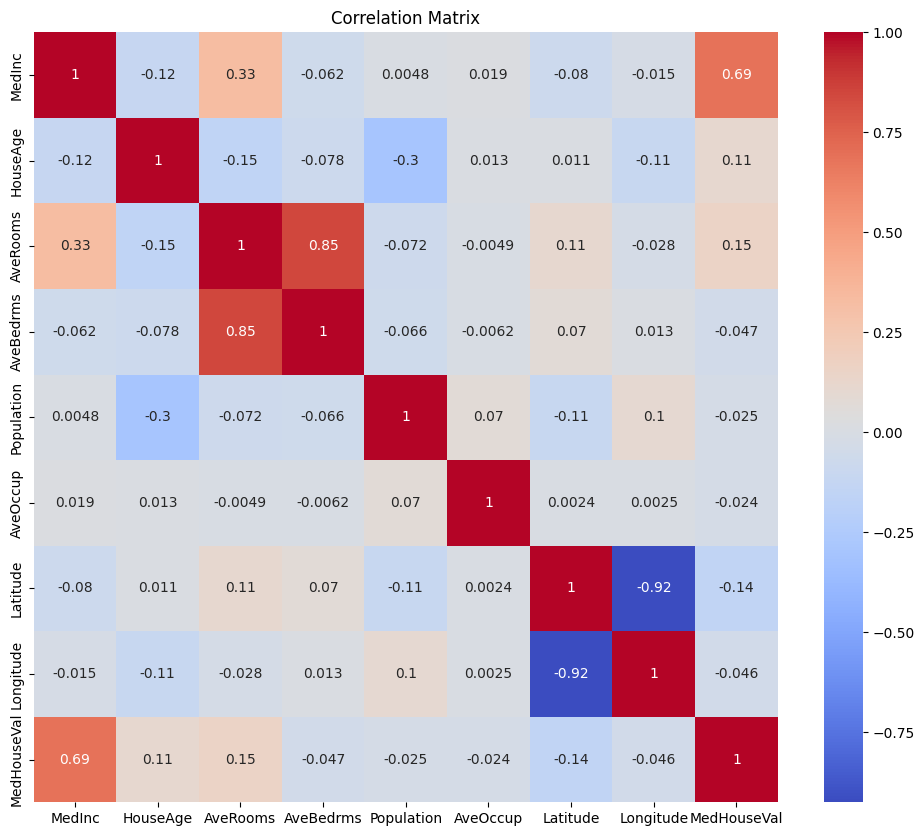

In [35]:
correlation_matrix = df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

I would like to take a look at MedIncome and MedHouseValue.

HouseAge and Population

MedInc and AverageRooms

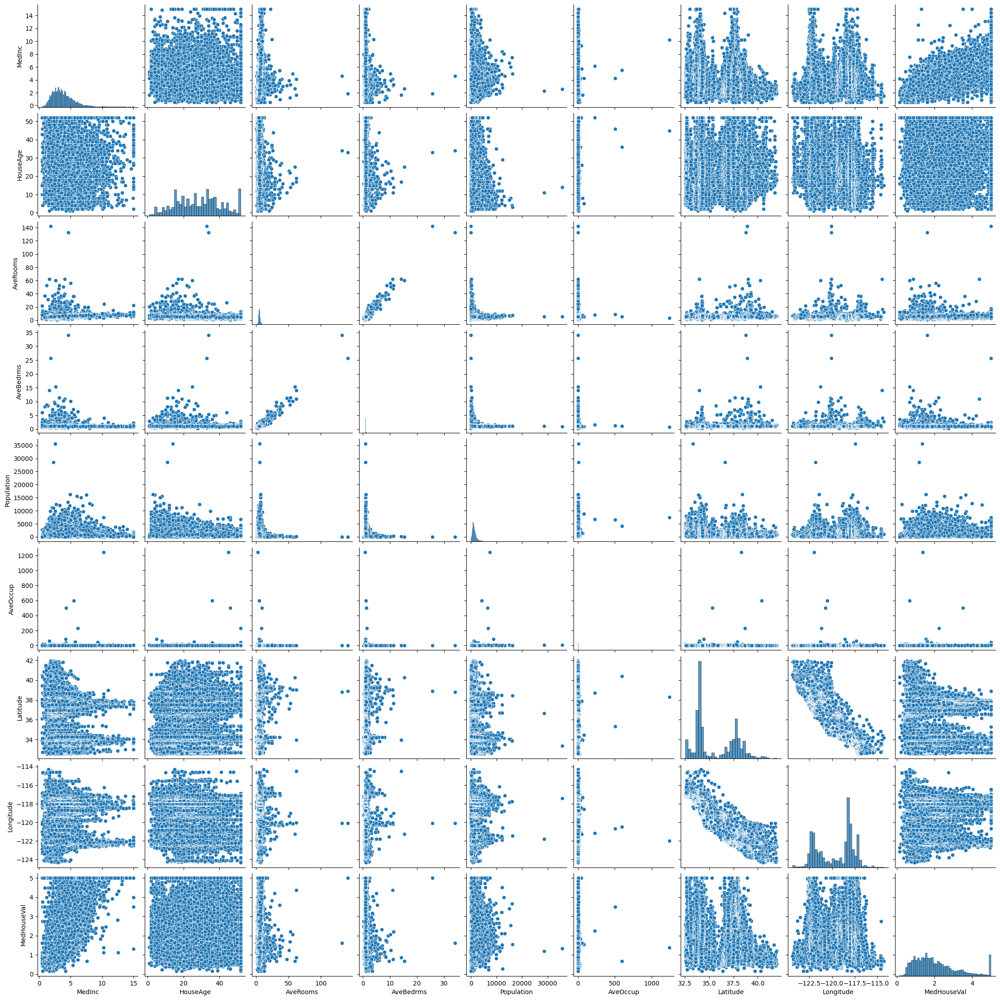

In [36]:
# Creating a pair plot to visualize relationships between features
sns.pairplot(df)
plt.show()


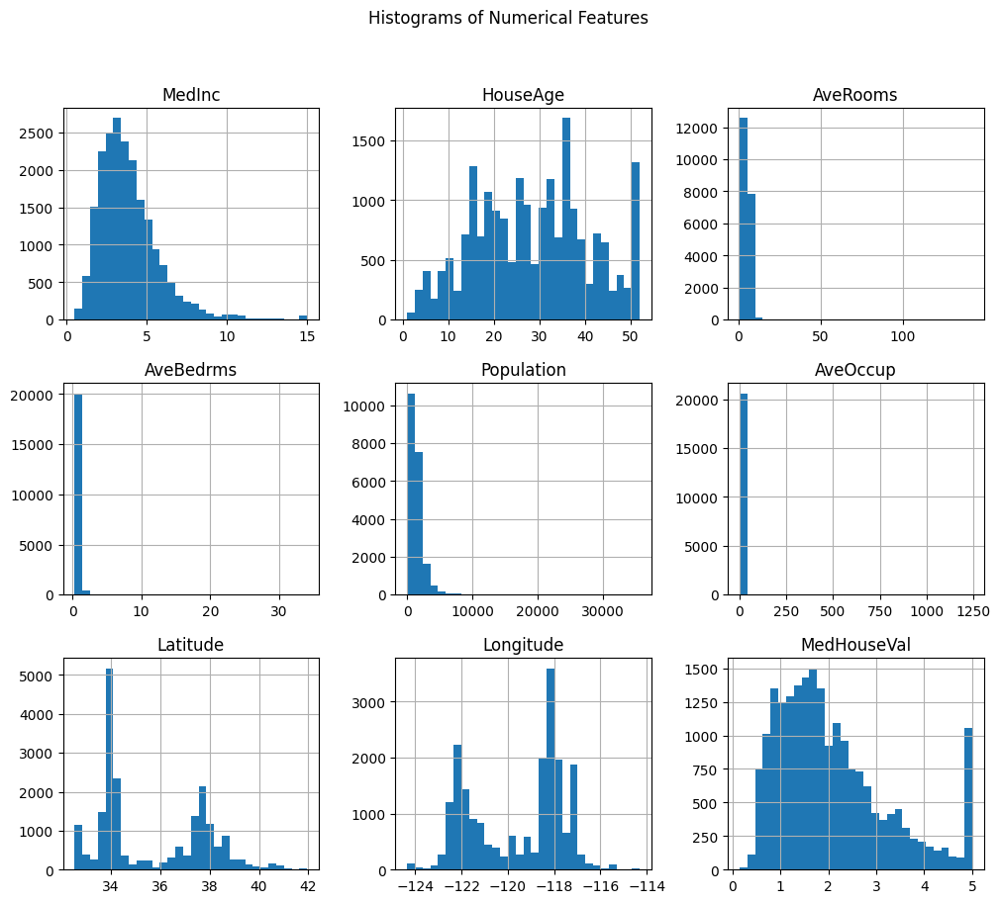

In [37]:
# Plotting histograms for each numerical feature
df.hist(figsize=(12, 10), bins=30)
plt.suptitle('Histograms of Numerical Features')
plt.show()


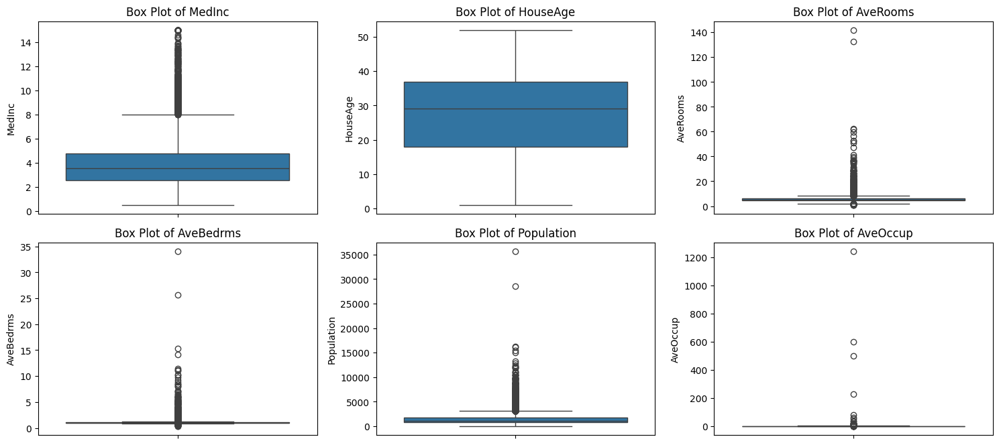

In [38]:
# Creating box plots for each numerical feature
plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(df[feature])
    plt.title(f'Box Plot of {feature}')
plt.tight_layout()
plt.show()


In [39]:
# Function to remove outliers using the IQR method
def remove_outliers(df, columns):
    for column in columns:
        Q1 = df[column].quantile(0.25)  # First quartile (25th percentile)
        Q3 = df[column].quantile(0.75)  # Third quartile (75th percentile)
        IQR = Q3 - Q1  # Interquartile Range (IQR)
        lower_bound = Q1 - 1.5 * IQR  # Lower bound for outliers
        upper_bound = Q3 + 1.5 * IQR  # Upper bound for outliers
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]  # Removing outliers
    return df

# Removing outliers from the numerical features
df = remove_outliers(df, numerical_features)

# Displaying the first few rows of the DataFrame to check the cleaned data
print(df.head())


   MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
3  5.6431      52.0  5.817352   1.073059       558.0  2.547945     37.85   
4  3.8462      52.0  6.281853   1.081081       565.0  2.181467     37.85   
5  4.0368      52.0  4.761658   1.103627       413.0  2.139896     37.85   
6  3.6591      52.0  4.931907   0.951362      1094.0  2.128405     37.84   
7  3.1200      52.0  4.797527   1.061824      1157.0  1.788253     37.84   

   Longitude  MedHouseVal  
3    -122.25        3.413  
4    -122.25        3.422  
5    -122.25        2.697  
6    -122.25        2.992  
7    -122.25        2.414  


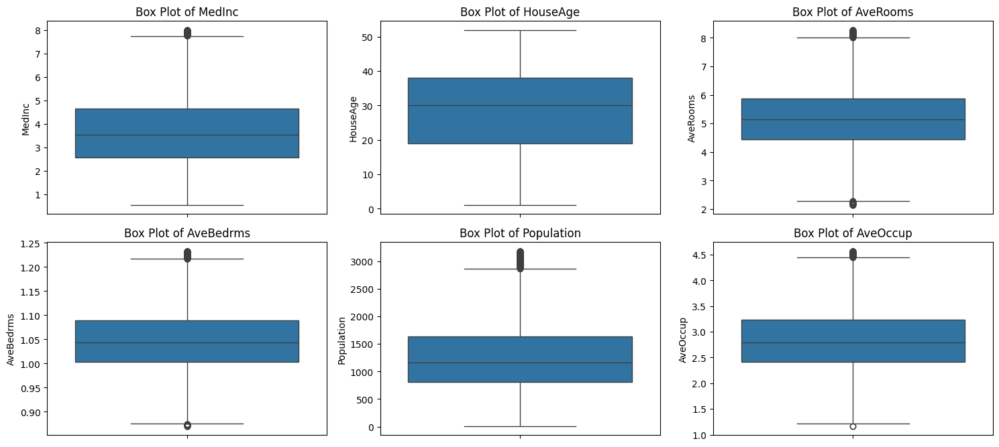

In [40]:
# Creating box plots for each numerical feature
plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(df[feature])
    plt.title(f'Box Plot of {feature}')
plt.tight_layout()
plt.show()


In [44]:
df['PopPerAveRoom']  = df['Population']/df['AveRooms']

df['BedroomsPerRoom'] = df['AveBedrms']/df['AveRooms']

df['ExtraRooms'] = df['AveRooms'] - df['AveBedrms']


df['PersonPerRoom'] = df['AveOccup'] / df['AveRooms']

df['PersonPerBedRoom'] = df['AveOccup'] / df['AveBedrms']

Explore the new features

In [45]:
new_features = ['PopPerAveRoom', 'BedroomsPerRoom', 'ExtraRooms', 'PersonPerRoom','PersonPerBedRoom']

for feature in new_features:
    fig = px.histogram(df, x=feature, nbins=30, title=f'Distribution of {feature}')
    fig.show()

People are sleeping in non bedrooms.

Too many people per bedroom.

In [46]:
# Scatter plots of new features against the target variable
for feature in new_features:
    fig = px.scatter(df, x=feature, y='MedHouseVal', trendline='ols', title=f'{feature} vs MedHouseVal')
    fig.show()

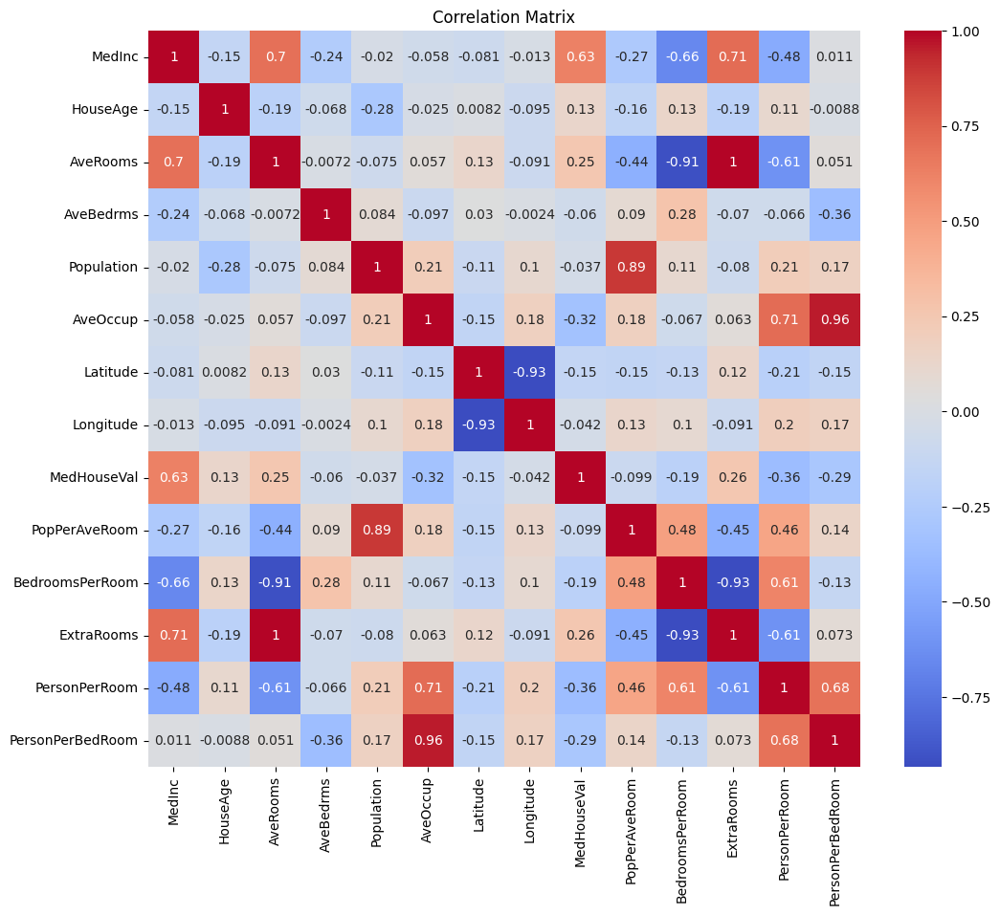

In [47]:
correlation_matrix = df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

ExtraRooms and median Income have a strong correlation.

AveOccupancy and MedHouseVal has a slight negative correlation showing that when more people are staying in the house, the medhouseval goes down.

I would like to know, whether a houses median value goes up or down based on the houses age.

<Axes: xlabel='HouseAge', ylabel='MedHouseVal'>

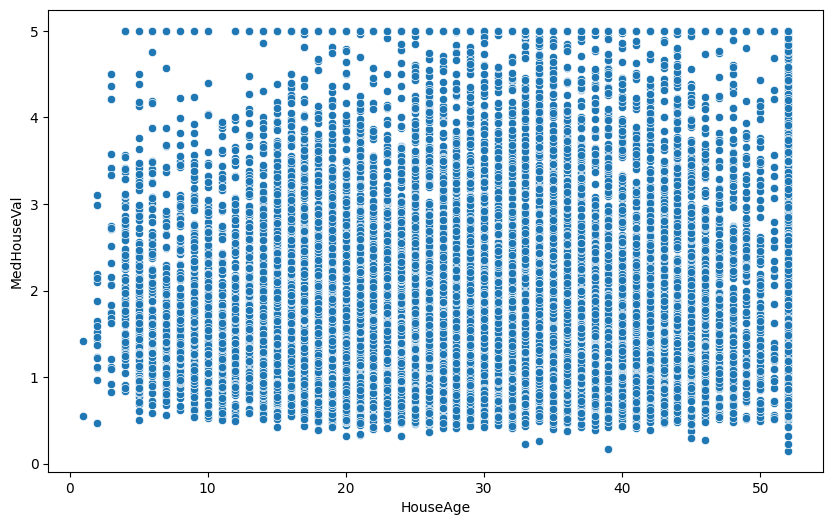

In [48]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='HouseAge', y='MedHouseVal', data=df)

Is there a significant difference in median house value between areas with higher vs. lower average income?

In [51]:
high_income = df[df['MedInc']>df['MedInc'].median()]['MedHouseVal']
low_income = df[df['MedInc']<=df['MedInc'].median()]['MedHouseVal']

t_statistic, p_value = ttest_ind(high_income, low_income)
print(f'T-statistic: {t_statistic}')
print(f'P-value: {p_value:.10f}')

if p_value < 0.05:
    print('There is a significant difference in median house value between areas with higher vs. lower average income.')
    print('Reject the null hypothesis.')
else:
    print('There is no significant difference in median house value between areas with higher vs. lower average income.')
    print('Fail to reject the null hypothesis.')

T-statistic: 74.48063652204183
P-value: 0.0000000000
There is a significant difference in median house value between areas with higher vs. lower average income.
Reject the null hypothesis.


In [52]:
# Visualizing the relationship between 'PopulationPerHousehold' and 'MedHouseVal'
fig = px.scatter(df, x='PopPerAveRoom', y='MedHouseVal', trendline='ols', title='PopPerAveRoom vs. Median House Value')
fig.show()

# Performing an independent t-test to compare the means of two groups: High and low 'PopulationPerHousehold'
high_population_per_household = df[df['PopPerAveRoom'] > df['PopPerAveRoom'].median()]['MedHouseVal']
low_population_per_household = df[df['PopPerAveRoom'] <= df['PopPerAveRoom'].median()]['MedHouseVal']

t_stat_population, p_value_population = ttest_ind(high_population_per_household, low_population_per_household)
print(f"T-statistic: {t_stat_population}, P-value: {p_value_population}")

# Interpreting the p-value
if p_value_population < 0.05:
    print("There is a significant difference in median house value between high and low 'PopPerAveRoom'.")
else:
    print("There is no significant difference in median house value between high and low 'PopPerAveRoom'.")


T-statistic: -14.154229836439617, P-value: 3.198166025428513e-45
There is a significant difference in median house value between high and low 'PopPerAveRoom'.
